In [1]:
from torchvision import transforms
from run import run_style_transfer
from image import load_img, show_img
from torch.autograd import Variable
import matplotlib.pyplot as plt
import numpy as np

In [2]:
Style = load_img('./image/Kanagawa.png')
Style = Variable(Style).cuda()
Content = load_img('./image/Cubic.png')
Content = Variable(Content).cuda()
Input = Content.clone()


In [3]:
output=[]
for i in range(15):
    out = run_style_transfer(Content, Style, Input, num_epoches=100,alpha=10**i,beta=1)
    output.append(transforms.ToPILImage()(out.cpu().squeeze(0)))
   

run 50
Style Loss: 0.0004678459 Content Loss: 0.0000000033

run 100
Style Loss: 0.0004678459 Content Loss: 0.0000000033

run 50
Style Loss: 0.0046119289 Content Loss: 0.0000337720

run 100
Style Loss: 0.0046048136 Content Loss: 0.0000376067

run 50
Style Loss: 0.0406445190 Content Loss: 0.0029683053

run 100
Style Loss: 0.0401888639 Content Loss: 0.0032278455

run 50
Style Loss: 0.1697786450 Content Loss: 0.1088924855

run 100
Style Loss: 0.1597140133 Content Loss: 0.1480611712

run 50
Style Loss: 0.2479318529 Content Loss: 0.5438896418

run 100
Style Loss: 0.3097996414 Content Loss: 0.6648500562

run 50
Style Loss: 0.3196162283 Content Loss: 1.2473614216

run 100
Style Loss: 0.2677114010 Content Loss: 1.1482573748

run 50
Style Loss: 0.4377720356 Content Loss: 1.7143379450

run 100
Style Loss: 0.3083346188 Content Loss: 1.6951342821

run 50
Style Loss: 1.1038185358 Content Loss: 2.1831946373

run 100
Style Loss: 0.6260951757 Content Loss: 2.3003680706

run 50
Style Loss: 4.2181682587 

In [6]:
def show_img(img,ax=plt):
    h = ax.imshow(img)
    ax.axis('off')
    return h

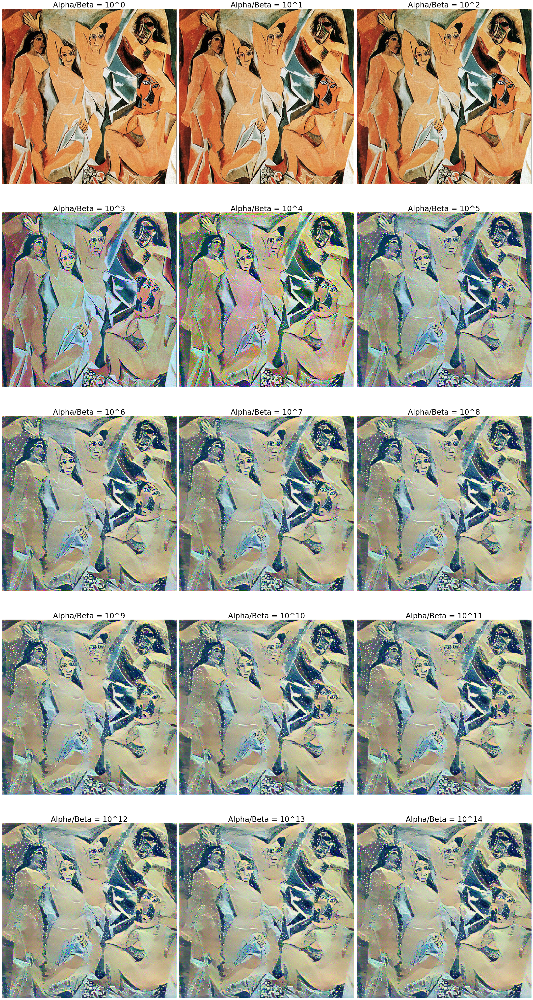

In [7]:
fig, axes = plt.subplots(ncols=3, nrows=5, figsize=(30,60),sharex='all',sharey='all')
for i in range(15):
    show_img(output[i], ax=axes[i//3][i%3])
    axes[i//3][i%3].set_title('Alpha/Beta = 10^{}'.format(i),fontdict={'size':30})
    plt.tight_layout()
    fig.canvas.draw()